# San Francisco Crime Classification

### 1 Introduction

    City of San Francisco, is considered as one of the most attractive tourist destinations with well known landmarks like Golden Gate Bridge, Fisherman's Wharf, Alcatraz Island and so many more.  San Francisco is also known as economic and tech centers where major banking institutions and tech companies gather. Along with these, criminal activities are never scarce. 
    This project is from a competition on Kaggle to predict criminal occurrences in the city.

![title](img/img1.png)

In [99]:
%matplotlib inline 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt # module for plotting 
import seaborn as sns
import datetime
import re
import matplotlib as mpl
from mpl_toolkits.basemap import Basemap
import matplotlib.cm as cm
from scipy.stats import norm

# Use the following only if you are on a high definition device
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

# The current version of NumPy available from conda is issuing a warning 
# message that some behavior will change in the future when used with the 
# current version of matplotlib available from conda. This cell just keeps
# that warning from being displayed.
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)


# Sure-fire way to turn off interactive mode in a Jupyter notebook

plt.ioff()
# Get a reference to the current IPython shell
shell = get_ipython()
# Import the event handler function that we are trying to unregister
from ipykernel.pylab.backend_inline import flush_figures
# Unregister the event handler for the current shell session
shell.events.unregister('post_execute', flush_figures)

### 2 Explortory Analysis

    This dataset includes incidents from SFPD Crime Incident Reporting system. The data ranges from 1/1/2003 to 5/13/2015. The training set and test set rotate every week, meaning week 1,3,5,7... belong to test set, week 2,4,6,8 belong to training set.
    
    The following data fields are given:
    
    Dates - timestamp of the crime incident
    Category - category of the crime incident (only in train.csv). This is the target variable to predict.
    Descript - detailed description of the crime incident (only in train.csv)
    DayOfWeek - the day of the week
    PdDistrict - name of the Police Department District
    Resolution - how the crime incident was resolved (only in train.csv)
    Address - the approximate street address of the crime incident 
    X - Longitude
    Y - Latitude

##### 2.1 Data Cleaning

In [2]:
# Load in train data. There are 9 fields: Dates,Category,Descprit, DayOfWeek, PdDistrict, Resolution, Address
# X, Y. Descript and Resolution only appear in train data. Category is the target variable. 
path = './'
train = pd.read_csv(path+'train.csv')
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [3]:
# The test data has Dates, DayOfWeek, PdDistrict, Address, X, and Y as predictor variables.
test = pd.read_csv(path+'test.csv')
test.head() 

,Id,Dates,DayOfWeek,PdDistrict,Address,X,Y
0,0,2015-05-10 23:59:00,Sunday,BAYVIEW,2000 Block of THOMAS AV,-122.399588,37.735051
1,1,2015-05-10 23:51:00,Sunday,BAYVIEW,3RD ST / REVERE AV,-122.391523,37.732432
2,2,2015-05-10 23:50:00,Sunday,NORTHERN,2000 Block of GOUGH ST,-122.426002,37.792212
3,3,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412
4,4,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412


In [4]:
# Split timestamp into separated components
# The dtypes of the feature 'DateTime' is object, we need to convert its type to datetime to be able
# to manipulate it. 
train['Dates'] = pd.to_datetime(train['Dates'])
test['Dates'] = pd.to_datetime(test['Dates'])
train['Dates'].head()

0   2015-05-13 23:53:00
1   2015-05-13 23:53:00
2   2015-05-13 23:33:00
3   2015-05-13 23:30:00
4   2015-05-13 23:30:00
Name: Dates, dtype: datetime64[ns]

In [5]:
## df: DataFrame
## attr: the source attribute (timestamp need to be split)
## aggr: the detination attribute (splitted attribute)
## return columns of designated attribute
def tfunc(df,attr='None',aggr='None',**kwargs):
    if ((attr=='None') or (aggr=='None')):
        print ('No conversion made!')
        return
    else:
        if aggr=='Year':
            return df[attr].apply(lambda x: x.year)
        elif aggr == 'Month':
            return df[attr].apply(lambda x: x.month)
        elif aggr == 'Day':
            return df[attr].apply(lambda x: x.day)
        elif aggr == 'Hour':
            return df[attr].apply(lambda x: x.hour)
        elif aggr == 'Minute':
            return df[attr].apply(lambda x: x.minute)
        elif aggr == 'Second':
            return df[attr].apply(lambda x: x.second)
        elif aggr =='Days_elapse':
            return (df[attr]-get_dt(df[attr],'min')).apply(lambda x: x.days)
        else:
            print ('Exception!')
        return
## return minimum of a series (Helper function)    
def get_dt(vec,method='min'):
    if method=='min':
        return vec.min()
    else:
        return

In [6]:
batch_opr = ['Year','Month','Day','Days_elapse','Hour','Minute']
for var in batch_opr:
    train[var]=tfunc(train,'Dates',var)
    test[var]=tfunc(test,'Dates',var)
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Year,Month,Day,Days_elapse,Hour,Minute
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,4510,23,53
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,4510,23,53
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13,4510,23,33
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13,4510,23,30
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13,4510,23,30


In [7]:
# Notice that the addresses could be broken down to 2 types: one such as OAK ST/LAGUNA ST and the other as
# 1500 Block of LOMBARD ST. The first type is probably crime happened at intersection or street corner. The
# second one is crime happend along single street. It is desirable to separate the address into 2 types and
# subdivide both type: 

street_features = ['Block#','Street','Junc_rd1','Junc_rd2']
for var in street_features:
    if var == 'Block#':
        train[var]=0
        test[var]=0
    else:
        train[var]='None'
        test[var]='None'

In [8]:
## use regex to separate address to Block #, Street, Junc_rd1, and Junc_rd2
def search_street(tc):
    if 'Block of ' in tc:
        m1 = re.search('([\d]+) Block of ([\w ]+)',tc)
        outcome = [m1.group(1),m1.group(2)]
    else:
        outcome = [-100,'None']
    if ' / ' in tc:
        m2 = re.search('([\w ]+) / ([\w ]+)',tc)
        outcome.extend([m2.group(1),m2.group(2)])
    else:
        outcome.extend(['None','None'])
    return outcome

def decompose_street(df):
    df.loc[:,['Block#','Street','Junc_rd1','Junc_rd2']]=list(df['Address'].apply(search_street))
    

In [9]:
decompose_street(train)
decompose_street(test)

In [10]:
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Year,Month,Day,Days_elapse,Hour,Minute,Block#,Street,Junc_rd1,Junc_rd2
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,4510,23,53,-100,None,OAK ST,LAGUNA ST
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,4510,23,53,-100,None,OAK ST,LAGUNA ST
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13,4510,23,33,-100,None,VANNESS AV,GREENWICH ST
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13,4510,23,30,1500,LOMBARD ST,None,None
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13,4510,23,30,100,BRODERICK ST,None,None


##### 2.2 Data Exploration

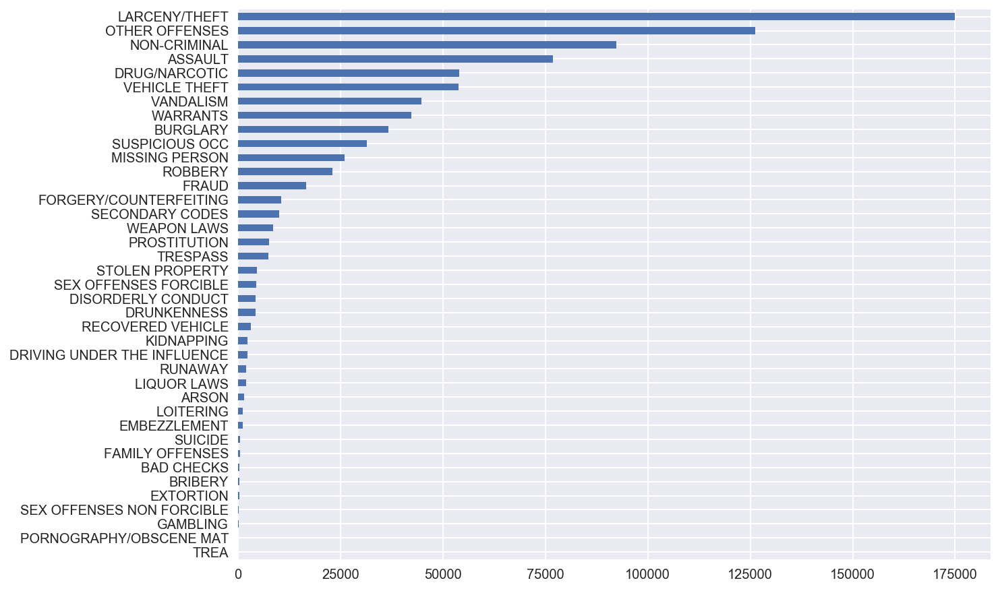

In [252]:
# Types of crime and corresponding occurrences
train['Category'].value_counts(ascending=True).plot(kind='barh',figsize=(10,7.5))
plt.show()

In [106]:
# Group crime type with less than 2% occurrences into Rare category. 
df_category = pd.DataFrame(train['Category'].value_counts())
df_category.columns=['Counts']
df_category['Freq']=df_category['Counts']/df_category['Counts'].sum()
thres = 0.02
crime_types = df_category.index.values
crime_conversion={}
for crime in crime_types:
    if df_category.loc[crime,'Freq']<thres:
        crime_conversion[crime]='Rare'
    else:
        crime_conversion[crime]=crime
train['Crime Type']=train['Category'].map(crime_conversion)
train['event']=1

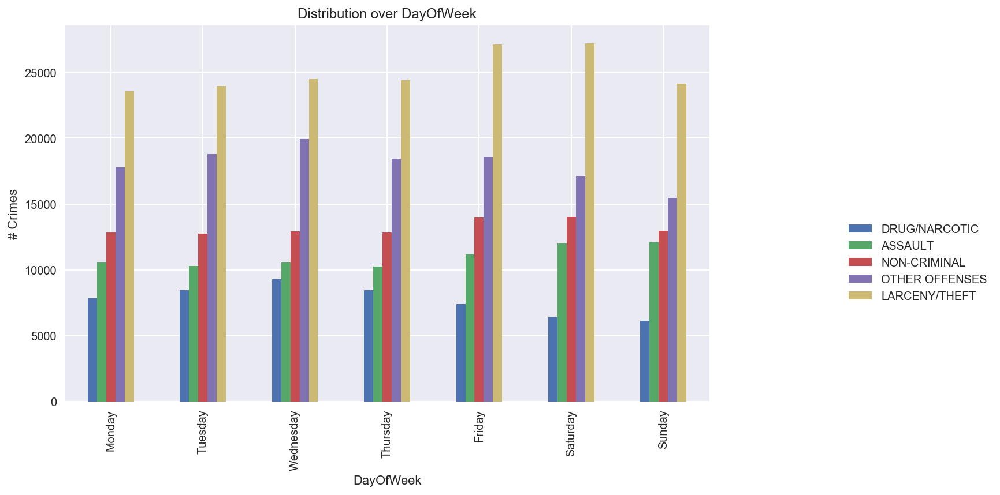

In [265]:
# Distribution of top 5 types of crimes within DayOfWeek
n = 5
subset = train['Category'].value_counts().nlargest(n).index
subdf = train[train['Category'].isin(subset)]
dow_events = subdf[['Category','DayOfWeek','event']].groupby(['Category','DayOfWeek']).count().reset_index()
dow_events_cate = dow_events.pivot(index='DayOfWeek', columns='Category', values='event').reindex(
    ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
dow_events_cate=dow_events_cate[[u'DRUG/NARCOTIC',u'ASSAULT',u'NON-CRIMINAL',u'OTHER OFFENSES',u'LARCENY/THEFT']]
dow_events_cate.plot(kind='bar',figsize=(10,6))
plt.ylabel('# Crimes')
plt.title('Distribution over DayOfWeek')
plt.legend(bbox_to_anchor=(1.2, 0.5))
plt.show()


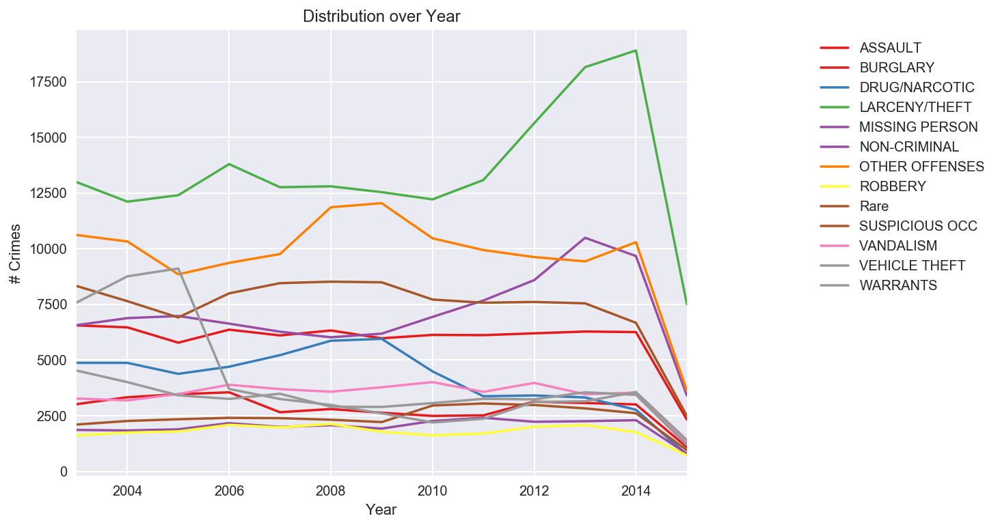

In [174]:
# Distribution of crime occurrences over years spaning from 2003 to 2015
year_events = train[['Crime Type','Year','event']].groupby(['Crime Type','Year']).count().reset_index()
year_events_cate = year_events.pivot(index='Year', columns='Crime Type',values='event')
year_events_cate.plot(figsize=(8,6),colormap='Set1')
plt.legend(bbox_to_anchor=(1.2, 1))
plt.title('Distribution over Year')
plt.ylabel('# Crimes')
plt.show()

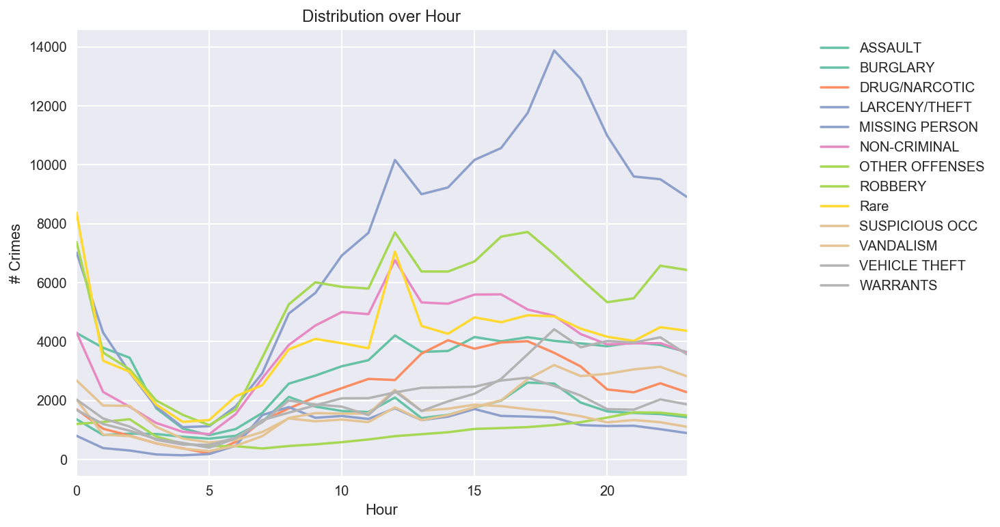

In [175]:
# Distribution of # crime occurrences at different time of a day.
hour_events = train[['Crime Type','Hour','event']].groupby(['Crime Type','Hour']).count().reset_index()
hour_events_cate = hour_events.pivot(index='Hour', columns='Crime Type',values='event')
hour_events_cate.plot(figsize=(8,6),colormap='Set2')
plt.legend(bbox_to_anchor=(1.2, 1))
plt.title('Distribution over Hour')
plt.ylabel('# Crimes')
plt.show()

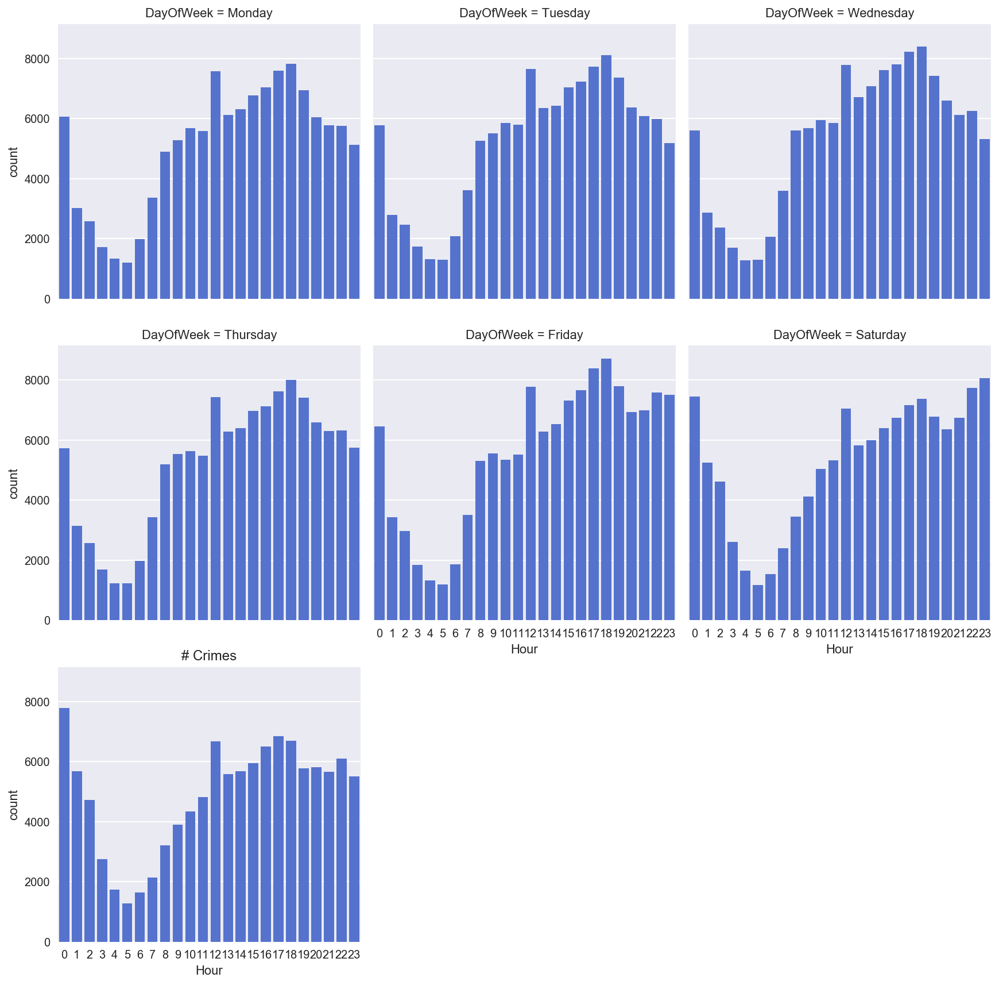

In [186]:
# Explore the pattern of # crime at different time and day of week. 
grid = sns.factorplot(data=train,x='Hour',col='DayOfWeek',col_wrap=3,kind='count',color='royalblue',
                      col_order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
plt.show()

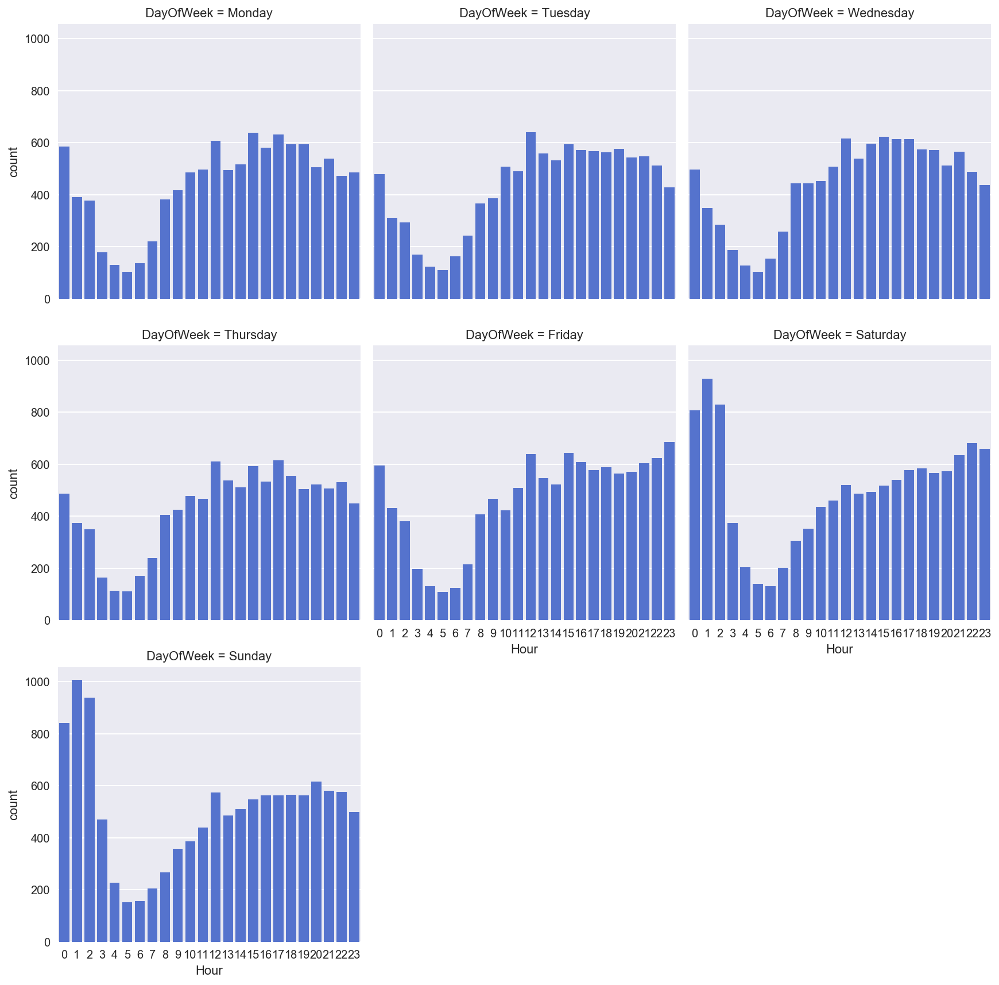

In [188]:
# Explore the pattern of # Assault at different time and day of week.
grid = sns.factorplot(data=train[train['Category']=='ASSAULT'],x='Hour',col='DayOfWeek',col_wrap=3,kind='count',color='royalblue',
                      col_order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
plt.show()

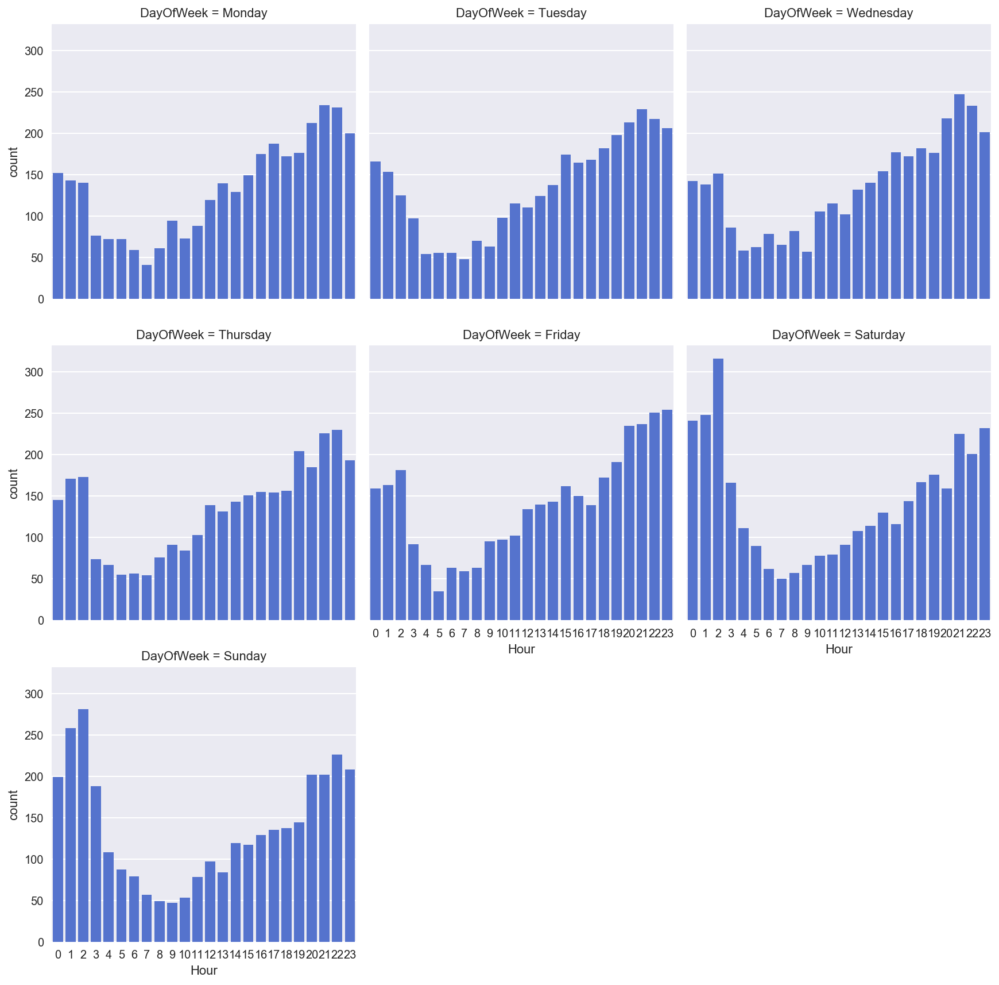

In [181]:
# Explore the pattern of # Robbery at different time and day of week.
grid = sns.factorplot(data=train[train['Category']=='ROBBERY'],x='Hour',col='DayOfWeek',col_wrap=3,kind='count',color='royalblue',
                      col_order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
plt.show()

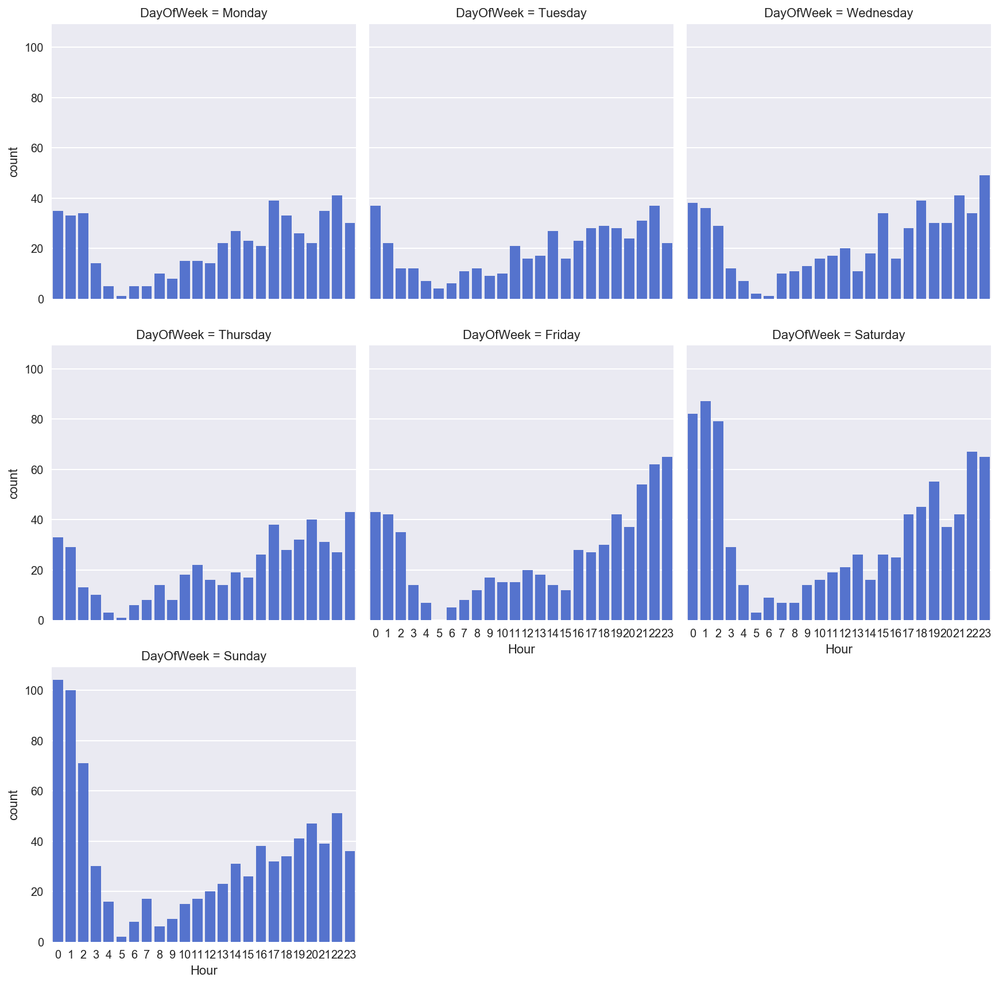

In [183]:
# Explore the pattern of # Drunkenness at different time and day of week.
grid = sns.factorplot(data=train[train['Category']=='DRUNKENNESS'],x='Hour',col='DayOfWeek',col_wrap=3,kind='count',color='royalblue',
                      col_order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
plt.show()

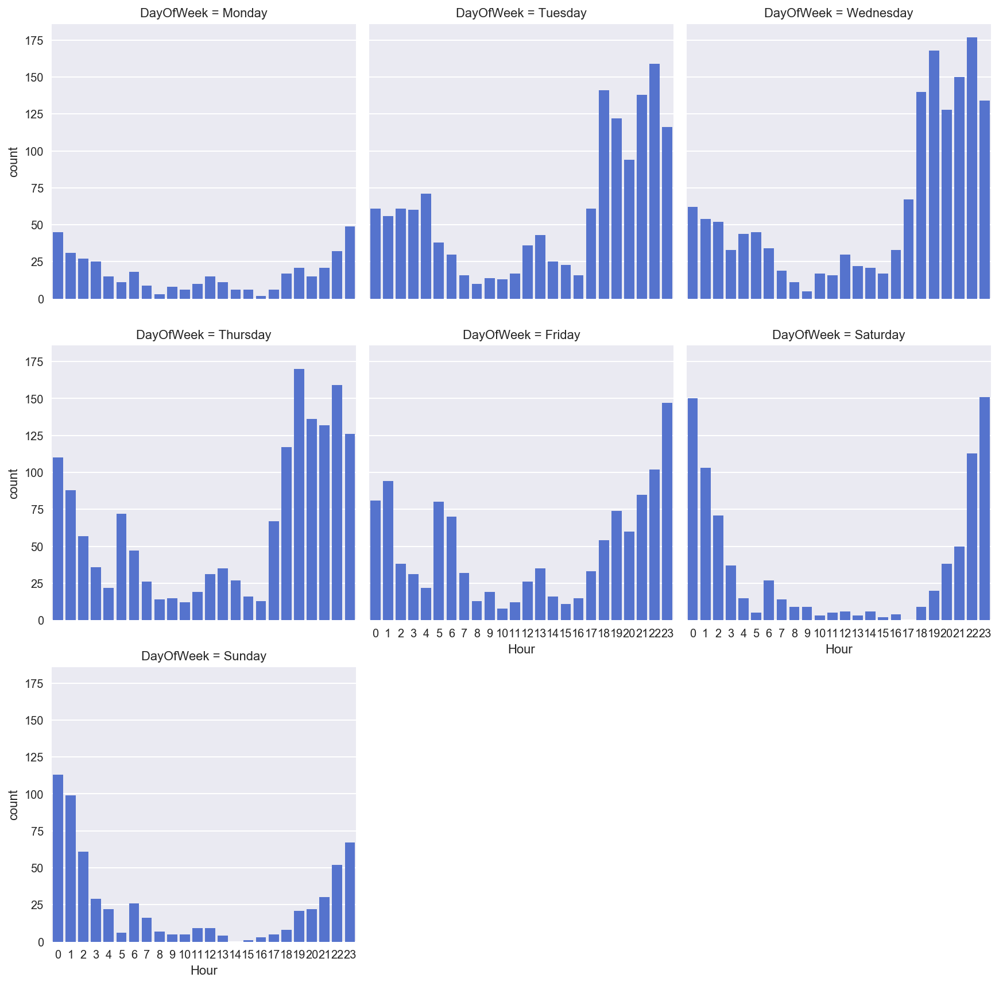

In [184]:
# Explore the pattern of # Prostitution at different time and day of week.
grid = sns.factorplot(data=train[train['Category']=='PROSTITUTION'],x='Hour',col='DayOfWeek',col_wrap=3,kind='count',color='royalblue',
                      col_order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
plt.show()

In [237]:
# Compare the crime numbers after president election outcome came out
trump = pd.read_csv(path+'election2016.csv')
obama2 = pd.read_csv(path+'election2012.csv')
trump['Time']=pd.to_datetime(trump['Time'])
obama2['Time']=pd.to_datetime(obama2['Time'])

trump['Hour']=trump['Time'].map(lambda x:x.hour)
obama2['Hour']=obama2['Time'].map(lambda x:x.hour)



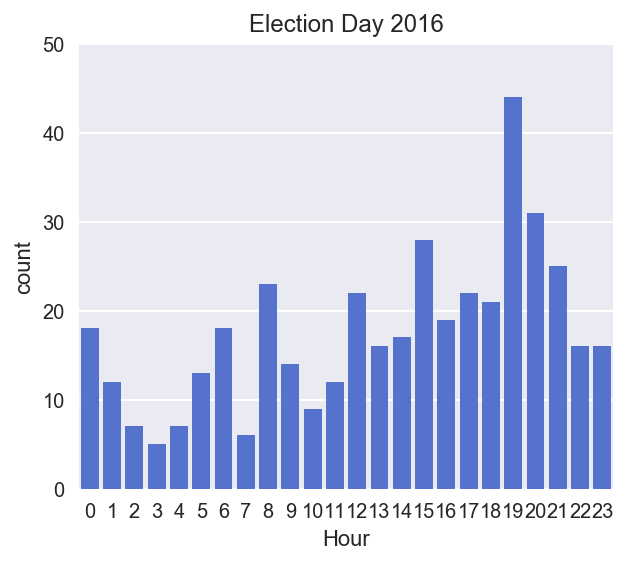

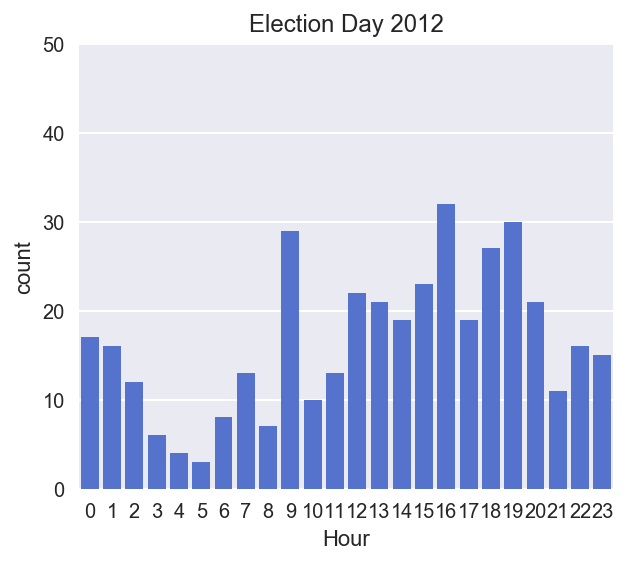

In [251]:
grid = sns.factorplot(data=trump,x='Hour',col='DayOfWeek',col_wrap=3,kind='count',color='royalblue',
                      col_order=['Tuesday'])
plt.ylim(0,50)
plt.title('Election Day 2016')
plt.show()
grid = sns.factorplot(data=obama2,x='Hour',col='DayOfWeek',col_wrap=3,kind='count',color='royalblue',
                      col_order=['Tuesday'])
plt.title('Election Day 2012')
plt.ylim(0,50)
plt.show()

San Franciso Crime Map

In [267]:
# Create a basemap with the bounding box and 'World Mercator Projection'
sf_map = Basemap(urcrnrlat=37.821981,     # top
              urcrnrlon=-122.343189,   # bottom
              llcrnrlat=37.697940,     # left
              llcrnrlon=-122.536498,   # right
              epsg=3857)

In [268]:
# These are the dimensions of the map we'll create
width = 20
height = 10

fig = plt.gcf()
fig.set_size_inches(width, height);

# The default DPI setting is 96, we're just specifying it here 
# to use it for calculating the number of x-axis pixels to request.
dpi = 96
xpixels = dpi * width


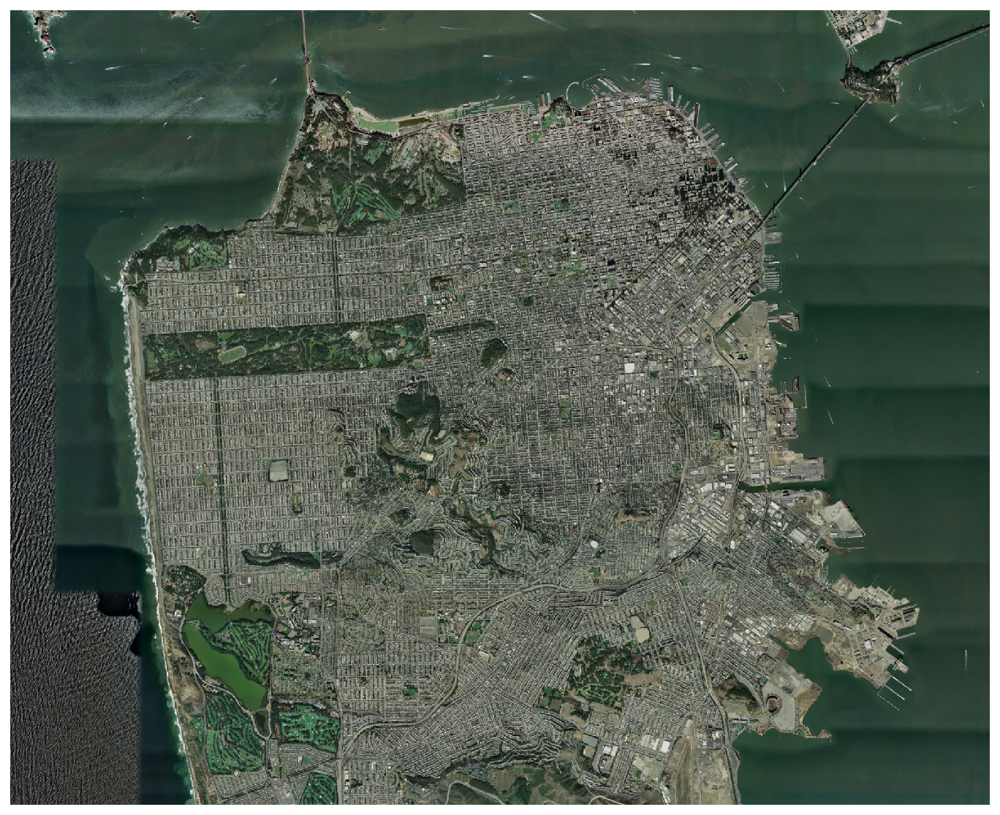

In [270]:
plt.figure(figsize=(20,10))
sf_map.arcgisimage(service='ESRI_Imagery_World_2D', xpixels=xpixels)
plt.show();
# A illustration of satelite image of San Francisco

In [271]:
# Convert crime location from geographic coordinate (lattitude, longitude) to Cartesian coordinate (X,Y)
lon = train['X'].values
lat = train['Y'].values
x,y = sf_map(lon,lat)

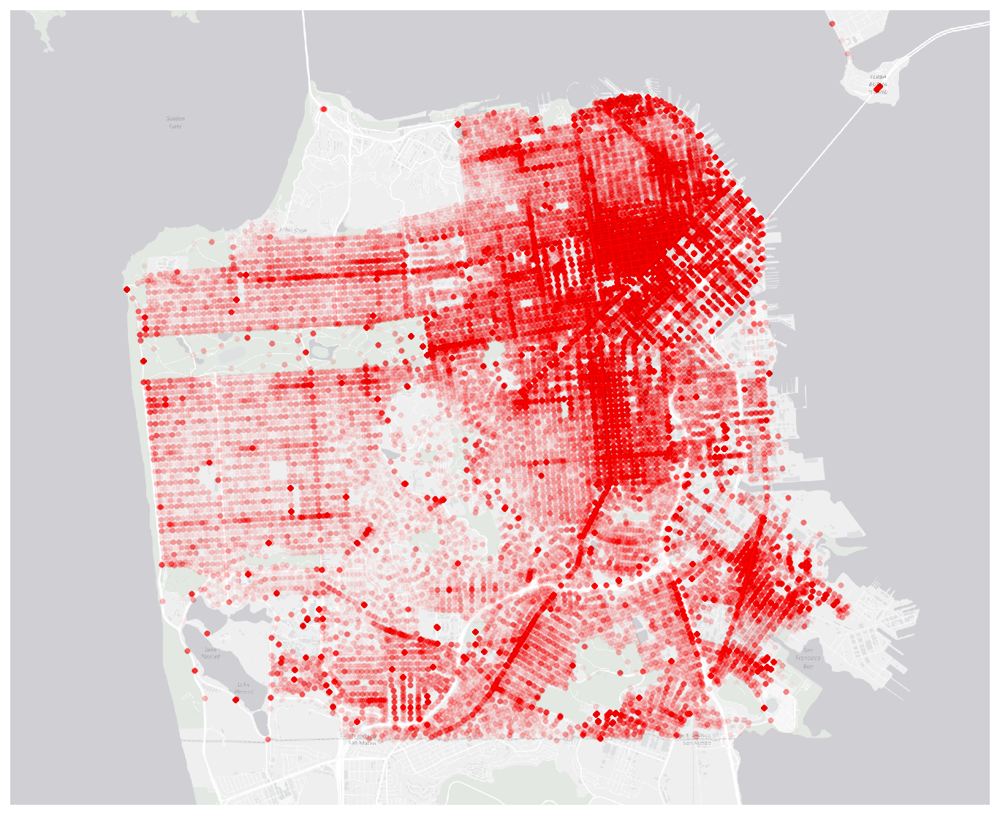

In [273]:
# Show the dot density map of crime overlaid on a San Franciso base map. Looks like the NorthEast of SF is more densed in 
# crime rate than other areas. 
plt.gcf().set_size_inches(width, height)
sf_map.arcgisimage(service='Canvas/World_Light_Gray_Base', xpixels=xpixels)
sf_map.scatter(x, y, c='r', alpha=0.01, marker='o', s=15, linewidths=0)
plt.show()

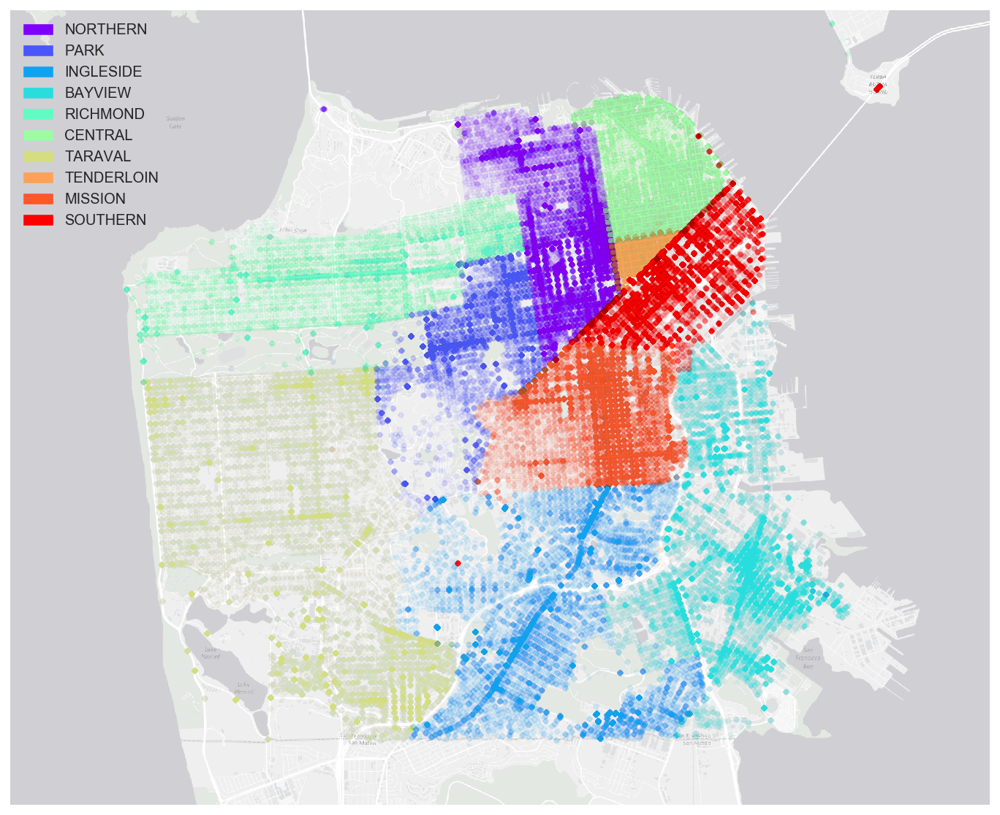

In [274]:
# Plot Crime density scatter categorized by police station.  

labels = train['PdDistrict'].unique()
colors = cm.rainbow(np.linspace(0, 1, len(labels)))
plt.gcf().set_size_inches(width, height)
sf_map.arcgisimage(service='Canvas/World_Light_Gray_Base', xpixels=xpixels)
color_patch=[]
for l,c in zip(labels,colors):
    lon = train[train['PdDistrict']==l]['X'].values
    lat = train[train['PdDistrict']==l]['Y'].values
    x,y = sf_map(lon,lat)
    sf_map.scatter(x,y,color=c,label=l,alpha=0.01, marker='o', s=15, linewidths=0)
    color_patch.append(mpl.patches.Patch(color=c, label=l))
plt.legend(handles=color_patch, loc=2)
plt.show()



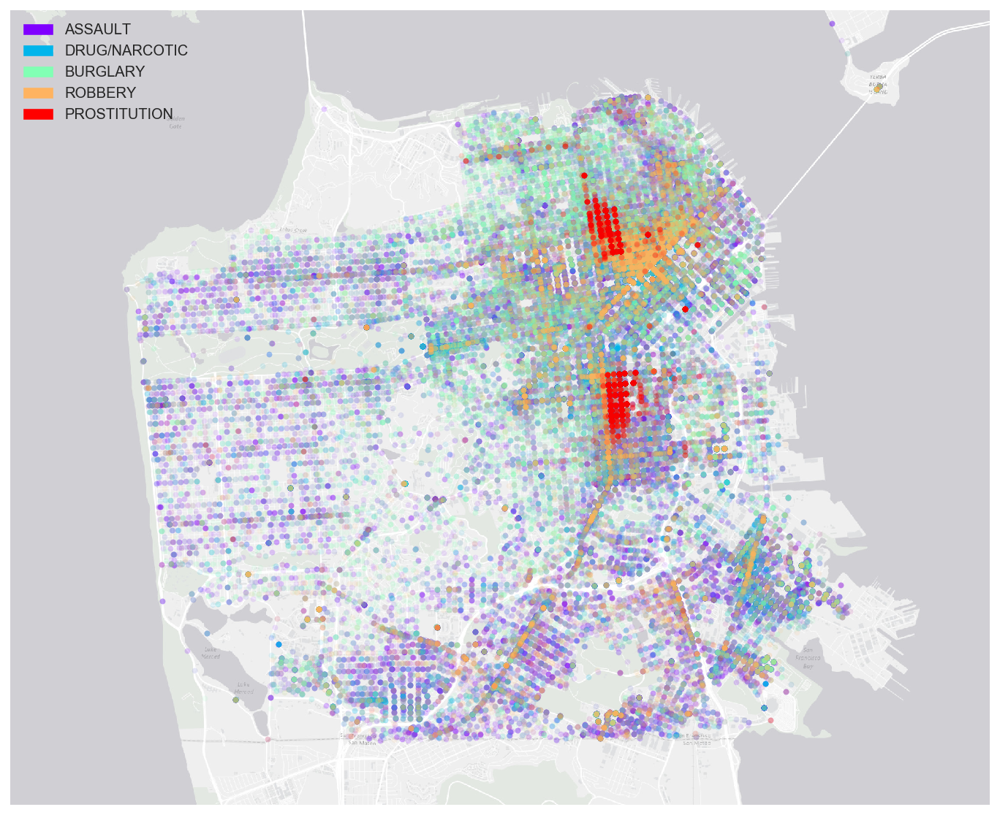

In [275]:
# Plot five selected crime overlaid on SF base map. It is found that some crimes like robbery and prostitution 
# have pattern of preferred crime areas. 
top_crime_cate = ['ASSAULT','DRUG/NARCOTIC','BURGLARY',
                  'ROBBERY','PROSTITUTION']
norm = mpl.colors.Normalize(vmin=0, vmax=1)
colors = cm.rainbow(norm(np.linspace(0, 1, len(top_crime_cate))))
plt.gcf().set_size_inches(width, height)
sf_map.arcgisimage(service='Canvas/World_Light_Gray_Base', xpixels=xpixels)
color_patch=[]
for l,c in zip(top_crime_cate,colors):
    lon = train[train['Category']==l]['X'].values
    lat = train[train['Category']==l]['Y'].values
    x,y = sf_map(lon,lat)
    sf_map.scatter(x,y,color=c,label=l,alpha=0.1, marker='o', s=15, linewidths=0)
    color_patch.append(mpl.patches.Patch(color=c, label=l))
plt.legend(handles=color_patch, loc=2)
plt.show()

### 3 Modeling and Prediction

##### 3.1 Feature Preprocessing

In [276]:
# Use numeric features 'Year','Month','Day','Days_elapse','Hour','Minute' and categorical features 'DayOfWeek','PdDistrict'
# as predictor variables
numeric_features = ['Year','Month','Day','Days_elapse','Hour','Minute']
categorical_features = ['DayOfWeek','PdDistrict']
train_num = train[numeric_features]
train_cat = train[categorical_features]
train_num = (train_num-train_num.mean())/train_num.std()
train_cat = pd.get_dummies(train_cat,drop_first=True)
train_cat.shape

(878049, 15)

##### 3.2 Modeling

In [279]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

In [280]:
X = pd.concat([train_num,train_cat],axis=1)
y = LabelEncoder().fit_transform(train['Category'])
Xtrain,Xtest,ytrain,ytest = train_test_split(X,y,test_size=0.33,random_state=42)

In [42]:
# Multinomial logistic regression

In [281]:
lr = LogisticRegression(solver='sag', max_iter=100,multi_class='multinomial')
C = [0.01, 0.1, 1]
tuned_parameters = [{'C':C}]
n_folds = 3

clf = GridSearchCV(lr,tuned_parameters,scoring = 'neg_log_loss',cv=n_folds)
clf.fit(Xtrain,ytrain)

GridSearchCV(cv=3, error_score='raise',
       estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='multinomial',
          n_jobs=1, penalty='l2', random_state=None, solver='sag',
          tol=0.0001, verbose=0, warm_start=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid=[{'C': [0.01, 0.1, 1]}], pre_dispatch='2*n_jobs',
       refit=True, return_train_score=True, scoring='neg_log_loss',
       verbose=0)

In [282]:
clf.cv_results_

{'mean_fit_time': array([ 30.60833327,  40.35933328,  86.92199993]),
 'mean_score_time': array([ 0.56000002,  0.44266677,  0.46333337]),
 'mean_test_score': array([-2.5672011 , -2.56453801, -2.56434985]),
 'mean_train_score': array([-2.56601784, -2.56294534, -2.56254553]),
 'param_C': masked_array(data = [0.01 0.1 1],
              mask = [False False False],
        fill_value = ?),
 'params': ({'C': 0.01}, {'C': 0.1}, {'C': 1}),
 'rank_test_score': array([3, 2, 1]),
 'split0_test_score': array([-2.56860778, -2.56581138, -2.56562006]),
 'split0_train_score': array([-2.56539441, -2.56233153, -2.56192768]),
 'split1_test_score': array([-2.56659781, -2.5640302 , -2.56386625]),
 'split1_train_score': array([-2.56626169, -2.56317047, -2.56277056]),
 'split2_test_score': array([-2.56639757, -2.56377232, -2.56356312]),
 'split2_train_score': array([-2.56639743, -2.56333401, -2.56293835]),
 'std_fit_time': array([ 0.83499392,  0.74032302,  5.26840575]),
 'std_score_time': array([ 0.1789208 , 

In [283]:
best_estimator = clf.best_estimator_
print best_estimator
lr_ytrain_pred=best_estimator.predict(Xtrain)
print 'Logistic regression accuracy(Train Set): ', accuracy_score(ytrain,lr_ytrain_pred)
lr_ytrain_prob=best_estimator.predict_proba(Xtrain)
print 'Logistic regression logloss(Train Set: ', log_loss(ytrain,lr_ytrain_prob)
lr_ytest_pred=best_estimator.predict(Xtest)
print 'Logistic regression accuracy(Test Set): ', accuracy_score(ytest,lr_ytest_pred)
lr_ytest_prob=best_estimator.predict_proba(Xtest)
print 'Logistic regression accuracy(Test Set): ', log_loss(ytest,lr_ytest_prob)


LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='multinomial',
          n_jobs=1, penalty='l2', random_state=None, solver='sag',
          tol=0.0001, verbose=0, warm_start=False)
Logistic regression accuracy(Train Set):  0.233497990794
Logistic regression logloss(Train Set:  2.5628425014
Logistic regression accuracy(Test Set):  0.233958109726
Logistic regression accuracy(Test Set):  2.56293888639


In [284]:
best_estimator.coef_.shape

(39L, 21L)

In [154]:
# Decision Tree

In [155]:
from sklearn import tree
dt = tree.DecisionTreeClassifier(max_depth=8,min_samples_leaf=1000,max_features=0.7)
dt.fit(Xtrain,ytrain)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8,
            max_features=0.7, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1000,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

In [156]:
dt_ytrain_pred=dt.predict(Xtrain)
print 'Decision Tree accuracy(Train Set):',accuracy_score(ytrain,dt_ytrain_pred)
dt_ytrain_prob=dt.predict_proba(Xtrain)
print 'Decision Tree log loss(Train Set):',log_loss(ytrain,dt_ytrain_prob)
dt_ytest_pred=dt.predict(Xtest)
print 'Decision Tree accuracy(Test Set):',accuracy_score(ytest,dt_ytest_pred)
dt_ytest_prob=dt.predict_proba(Xtest)
print 'Decision Tree log loss(Test Set):',log_loss(ytest,dt_ytest_prob)


Decision Tree accuracy(Train Set): 0.253848429011
Decision Tree log loss(Train Set): 2.50175004569
Decision Tree accuracy(Test Set): 0.254133636116
Decision Tree log loss(Test Set): 2.52696359964


In [159]:
# Bagging

In [160]:
from sklearn.ensemble import BaggingClassifier
bagging_params={'base_estimator':tree.DecisionTreeClassifier(),'n_estimators':100,'max_samples':0.5,'max_features':0.5,
               'bootstrap':True, 'bootstrap_features':True,'oob_score':True}
bagging = BaggingClassifier(**bagging_params)
bagging.fit(Xtrain,ytrain)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best'),
         bootstrap=True, bootstrap_features=True, max_features=0.5,
         max_samples=0.5, n_estimators=100, n_jobs=1, oob_score=True,
         random_state=None, verbose=0, warm_start=False)

In [ ]:
print 'Out Of Bag accuracy score is :', bagging.oob_score_

In [ ]:
bg_ytrain_pred=bagging.predict(Xtrain)
print 'Decision Tree accuracy(Train Set):',accuracy_score(ytrain,bg_ytrain_pred)
bg_ytrain_prob=bagging.predict_proba(Xtrain)
print 'Decision Tree log loss(Train Set):',log_loss(ytrain,bg_ytrain_prob)
bg_ytest_pred=bagging.predict(Xtest)
print 'Decision Tree accuracy(Test Set):',accuracy_score(ytest,bg_ytest_pred)
bg_ytest_prob=bagging.predict_proba(Xtest)
print 'Decision Tree log loss(Test Set):',log_loss(ytest,bg_ytest_prob)

In [161]:
# Random Forest

In [44]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(max_depth=2,random_state=0,n_estimators=40,oob_score=True,n_jobs=-1)
rf.fit(Xtrain,ytrain)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=2, max_features='auto', max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=100, n_jobs=-1, oob_score=True, random_state=0,
            verbose=0, warm_start=False)

In [45]:
print 'Out Of Bag accuracy score is :', rf.oob_score_

Out Of Bag accuracy score is : 0.203402392009


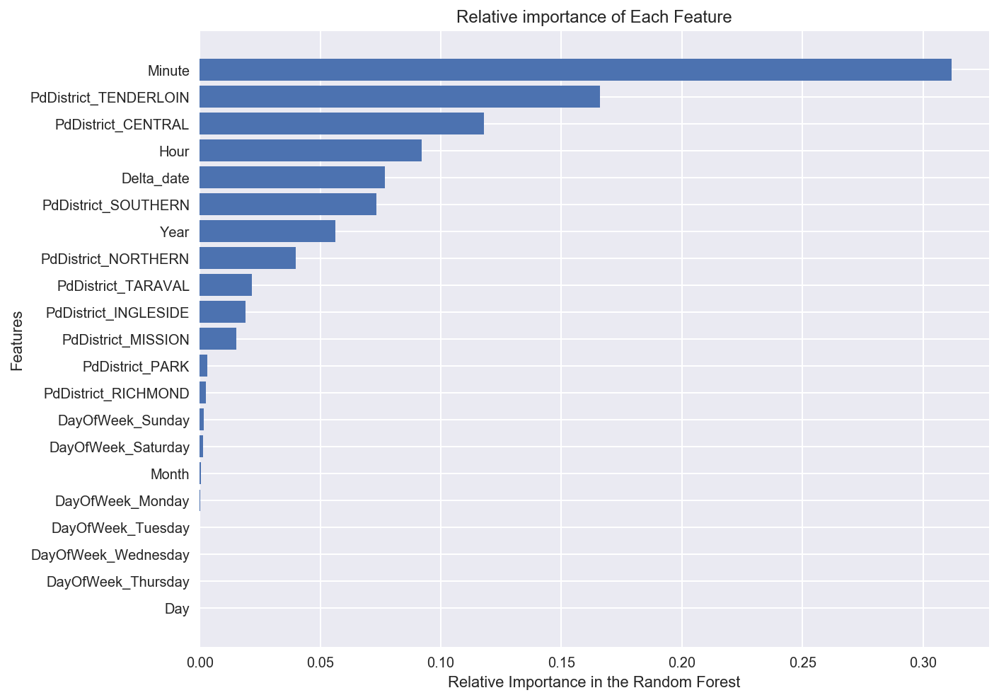

In [46]:
importance_list = rf.feature_importances_
name_list = X.columns
importance_list,name_list = zip(*sorted(zip(importance_list,name_list)))
plt.figure(figsize=(10,8))
plt.barh(range(len(name_list)),importance_list,align='center')
plt.yticks(range(len(name_list)),name_list)
plt.xlabel('Relative Importance in the Random Forest')
plt.ylabel('Features')
plt.title('Relative importance of Each Feature')
plt.show()

In [48]:
rf_ytrain_pred=rf.predict(Xtrain)
print 'Random Forest accuracy(Train Set):',accuracy_score(ytrain,rf_ytrain_pred)
rf_ytrain_prob=rf.predict_proba(Xtrain)
print 'Random Forest log loss(Train Set):',log_loss(ytrain,rf_ytrain_prob)
rf_ytest_pred=rf.predict(Xtest)
print 'Random Forest accuracy(Test Set):',accuracy_score(ytest,rf_ytest_pred)
rf_ytest_prob=rf.predict_proba(Xtest)
print 'Random Forest log loss(Test Set):',log_loss(ytest,rf_ytest_prob)

Random Forest accuracy(Train Set): 0.203162715114
Random Forest log loss(Train Set): 2.62023653782
Random Forest accuracy(Test Set): 0.203822513347
Random Forest log loss(Test Set): 2.61979038843


In [1]:
# Boosting

In [2]:
# AdaBoost

In [51]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

In [56]:
bdt = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1),algorithm='SAMME',n_estimators=200)

In [57]:
bdt.fit(Xtrain,ytrain)

AdaBoostClassifier(algorithm='SAMME',
          base_estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=1,
            max_features=None, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best'),
          learning_rate=1.0, n_estimators=200, random_state=None)

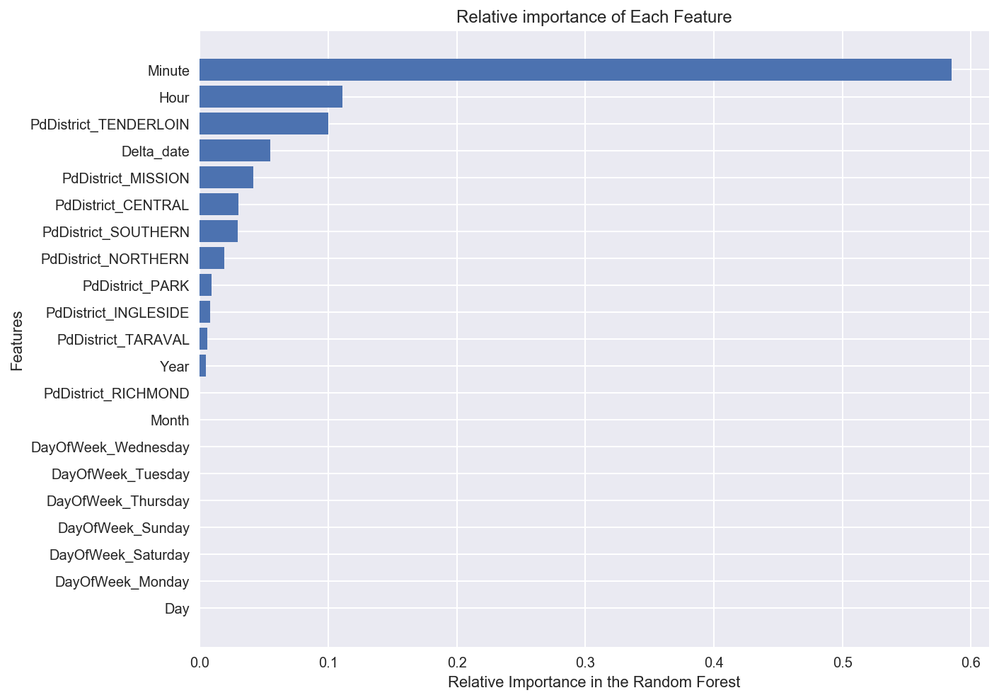

In [58]:
importance_list = bdt.feature_importances_
name_list = X.columns
importance_list,name_list = zip(*sorted(zip(importance_list,name_list)))
plt.figure(figsize=(10,8))
plt.barh(range(len(name_list)),importance_list,align='center')
plt.yticks(range(len(name_list)),name_list)
plt.xlabel('Relative Importance in the Random Forest')
plt.ylabel('Features')
plt.title('Relative importance of Each Feature')
plt.show()

In [59]:
bdt_ytrain_pred=bdt.predict(Xtrain)
print 'AdaBoost accuracy(Train Set):',accuracy_score(ytrain,bdt_ytrain_pred)
bdt_ytrain_prob=bdt.predict_proba(Xtrain)
print 'AdaBoost log loss(Train Set):',log_loss(ytrain,bdt_ytrain_prob)
bdt_ytest_pred=bdt.predict(Xtest)
print 'AdaBoost accuracy(Test Set):',accuracy_score(ytest,bdt_ytest_pred)
bdt_ytest_prob=bdt.predict_proba(Xtest)
print 'AdaBoost log loss(Test Set):',log_loss(ytest,bdt_ytest_prob)

AdaBoost accuracy(Train Set): 0.22063703059
AdaBoost log loss(Train Set): 3.66320911866
AdaBoost accuracy(Test Set): 0.221202593898
AdaBoost log loss(Test Set): 3.66320901466
